# Topic Modeling

In [16]:
from pathlib import Path
from sklearn.feature_extraction.text import CountVectorizer
from bertopic import BERTopic
from top2vec import Top2Vec
from data import get_documents_list, get_cleaned_documents_list, get_topic_modeling_path

## Method 1: Top2Vec

In [9]:
multilingual_documents = get_documents_list()

In [10]:
multilingual_documents[101]

'Ignatz Waghalter (* 15. März 1881 in Warschau; † 7. April 1949 in New York City) war ein polnisch-deutscher Komponist und Dirigent.'

## Train Top2Vec model on documents
- Recommended for multilingual datasets: 'distiluse-base-multilingual-cased' (pre-trained sentence transformer)
- no specified will use doc2vec method -> not multilingual
- no need to remove stop words

#### Parameter:
- ngram_vocab: True allows bigrams (no trigrams etc.!)
- min_count: ignore words with smaller total count
- verbose: True to print status duri training

In [11]:
top2vec_model = Top2Vec(multilingual_documents, verbose=True, min_count=10, ngram_vocab=True, embedding_model='distiluse-base-multilingual-cased')
topic_models_path: Path = Path(get_topic_modeling_path())

2022-09-16 11:26:54,392 - top2vec - INFO - Pre-processing documents for training
2022-09-16 11:26:54,605 - top2vec - INFO - Downloading distiluse-base-multilingual-cased model
2022-09-16 11:26:56,946 - top2vec - INFO - Creating joint document/word embedding
2022-09-16 11:28:58,768 - top2vec - INFO - Creating lower dimension embedding of documents
2022-09-16 11:29:00,784 - top2vec - INFO - Finding dense areas of documents
2022-09-16 11:29:00,800 - top2vec - INFO - Finding topics


In [12]:
top2vec_model.save(topic_models_path.joinpath("Top2Vec_multilingual"))

In [ ]:
top2vec_model = Top2Vec.load(topic_models_path.joinpath("/Top2Vec_multilingual"))

In [13]:
top2vec_model.get_num_topics()

9

In [14]:
words, word_scores = top2vec_model.similar_words(keywords=["Schoenberg"], keywords_neg=[], num_words=20) 
for word, score in zip(words, word_scores):
    print(f"{word} {score}")

schonberg 0.8789182910434017
fitelberg 0.8575633623396246
grzegorz fitelberg 0.7697791900455137
salzburg 0.7282399173498251
arnold schoenberg 0.7222844299833705
fritz 0.6767010522055235
leibowitz 0.6628771785799432
schnabel 0.6520129746211508
arnold schonberg 0.6501298757311247
werner 0.6479105965186455
siegfried 0.640864365589467
wiener 0.6400138172819045
bernhard 0.6383572168306233
stravinsky 0.631416182699011
eisler 0.6229397389739414
jessel 0.6168720388155726
willner 0.6135416917204782
munich 0.6071191673443367
erwin schulhoff 0.6047602687726652
schlesinger 0.6025715396759643


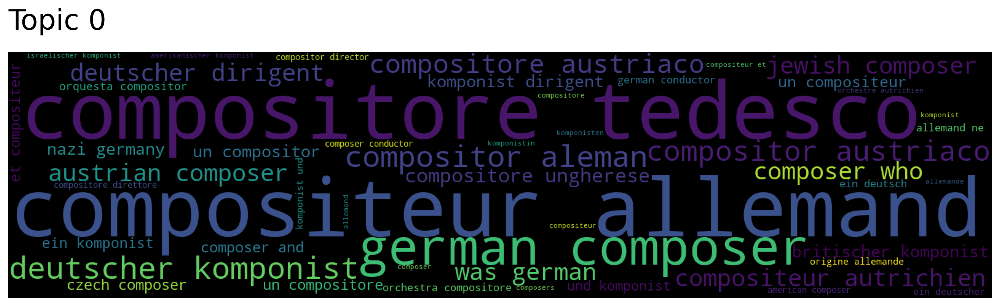

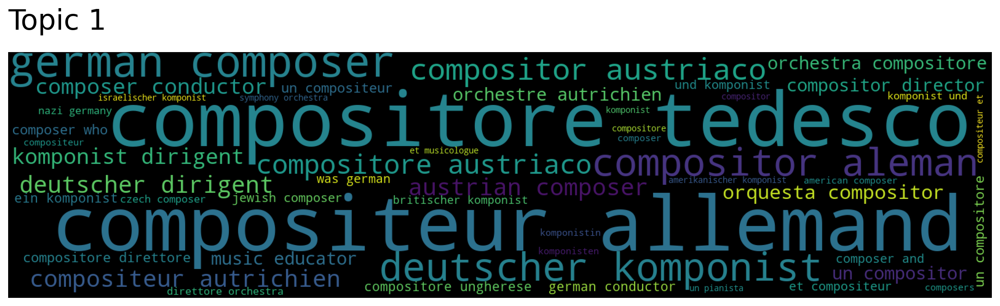

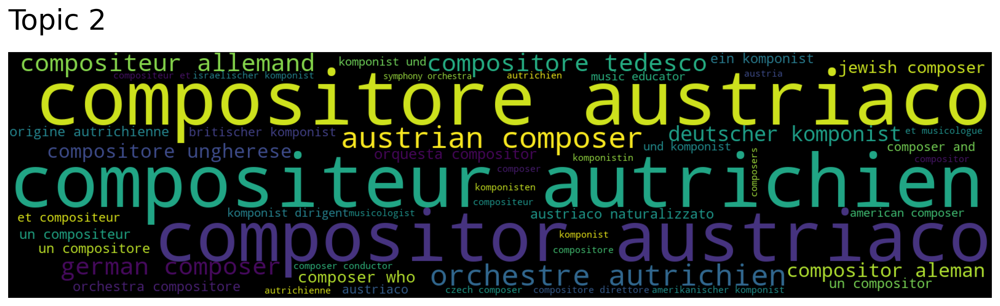

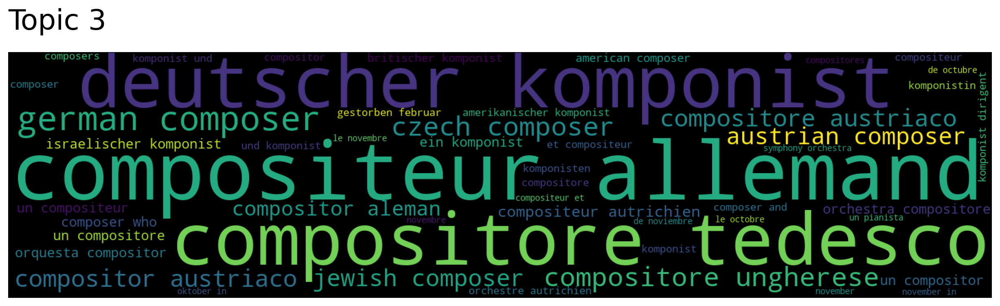

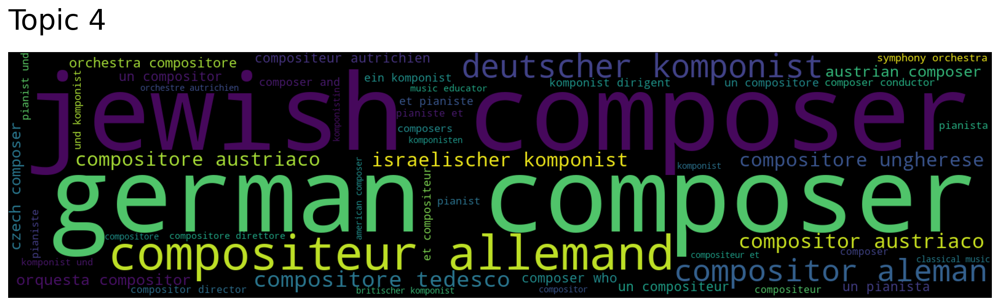

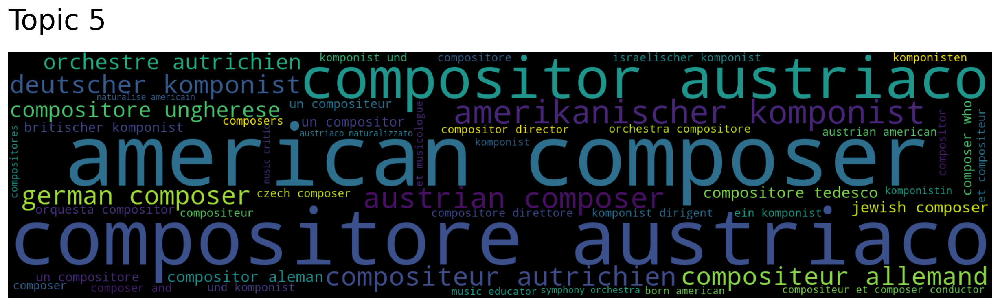

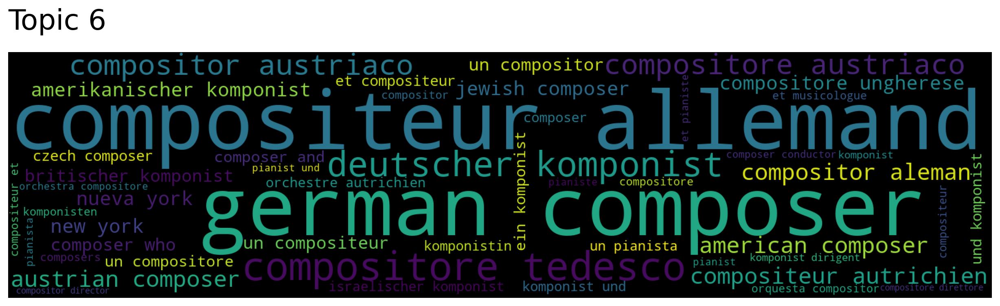

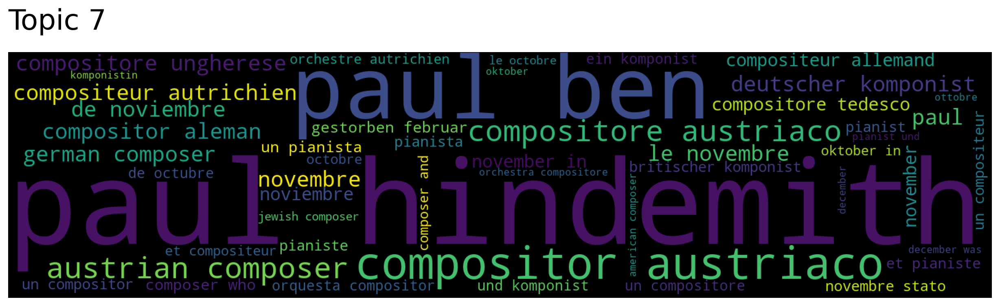

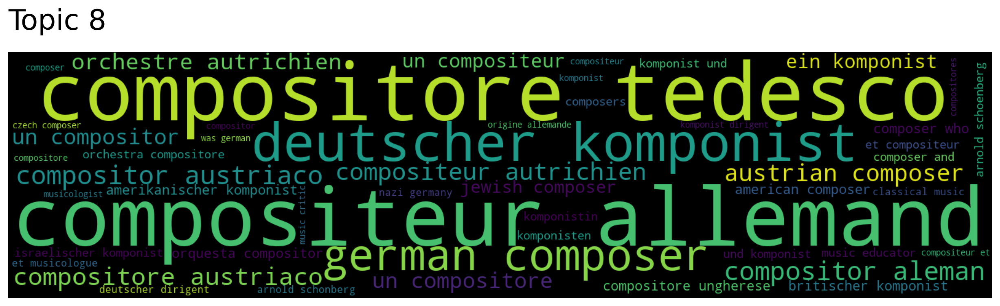

In [15]:
for topic in range(top2vec_model.get_num_topics()):
    top2vec_model.generate_topic_wordcloud(topic)

## Method 2: BERTopic

- Train model on documents with mixed languages
- merge stopwords for each language:

In [3]:
# use cleaned documents
multilingual_documents_cleaned = get_cleaned_documents_list()

- language="multilingual" results in using sentence-transformers model "paraphrase-multilingual-MiniLM-L12-v2"
- use Parameter min_topic_size=40 for less topics

In [4]:
vectorizer_model = CountVectorizer(ngram_range=(1, 2))
topic_model = BERTopic(verbose=True, language="multilingual", vectorizer_model=vectorizer_model)
topics, probs = topic_model.fit_transform(multilingual_documents_cleaned)

Batches:   0%|          | 0/25 [00:00<?, ?it/s]

2022-09-16 11:24:10,272 - BERTopic - Transformed documents to Embeddings
2022-09-16 11:24:14,607 - BERTopic - Reduced dimensionality
2022-09-16 11:24:14,639 - BERTopic - Clustered reduced embeddings


In [5]:
topic_models_path: Path = Path(get_topic_modeling_path())
topic_model.save(topic_models_path.joinpath("BERTopic_multilingual"))

Code to update topic representations to try different parameters:
topic_model.update_topics(multilingual_documents, topics, vectorizer_model=cv)

In [7]:
topic_model = BERTopic.load(topic_models_path.joinpath("BERTopic_multilingual"))

In [6]:
topic_model.get_topic_info()

,Topic,Count,Name
0,-1,253,-1_komponist_composer_new_né
1,0,239,0_music_composer_he_compositeur
2,1,85,1_komponist_deutscher_deutscher komponist_berlin
3,2,44,2_ben_paul_haim_ben haim
4,3,44,3_österreich_österreich ungarn_ungarn_komponist
5,4,26,4_szpilman_komponist_weinberg_warschau
6,5,26,5_kaper_milhaud_bartók_béla
7,6,20,6_amsterdam_van_1881_gilse
8,7,16,7_czech_1940_vítězslava_kaprálová
9,8,16,8_berlin_roman_martin_new


In [7]:
topic_model.visualize_topics()

In [ ]:
topic_model.transform("Schönberg")

In [8]:
for i in range(len(topic_model.get_topic_info())):
    print(f"Thema {i-1}")
    list = topic_model.get_topic(i-1)
    for elem in list:
        print(elem)
    print()

Thema -1
('komponist', 0.012066581801625575)
('composer', 0.01064375652959499)
('new', 0.008003128686140722)
('né', 0.007997036608782041)
('compositeur', 0.007596468941253553)
('he', 0.007415193155629216)
('york', 0.007255387799808893)
('pianist', 0.007185509586525762)
('mort', 0.0071386816088923385)
('new york', 0.0069783164353429935)

Thema 0
('music', 0.016773048107396233)
('composer', 0.01570748607563181)
('he', 0.013581943868851304)
('compositeur', 0.012024423139488772)
('conductor', 0.01121645450125519)
('né', 0.010774427373719291)
('mort', 0.009711714182491947)
('german', 0.009676979882181939)
('vienna', 0.009265092115264145)
('austrian', 0.009149418388673546)

Thema 1
('komponist', 0.034658597141056555)
('deutscher', 0.03130926032942266)
('deutscher komponist', 0.02252869705602503)
('berlin', 0.02142153898160893)
('dirigent', 0.017925850335515907)
('er', 0.013466757298905908)
('pianist', 0.01295347658320666)
('musikpädagoge', 0.012271154164990172)
('1886', 0.012012910359961026)